# Exploratory Data Analysis (EDA)

## Table of Contents
1. [Dataset Overview](#dataset-overview)
2. [Handling Missing Values](#handling-missing-values)
3. [Feature Distributions](#feature-distributions)
4. [Possible Biases](#possible-biases)
5. [Correlations](#correlations)


## Initial Setup

In [1]:
# libraries for dataset operations
import pandas as pd
import numpy as np

# libraries for data visualization
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import pywt

# statistical time series tools
from scipy.stats import kurtosis, normaltest, shapiro
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.signal import periodogram
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import SpectralClustering
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# ignoring warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# setting default number of rows and columns to be displayed
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)  # No limit on column width
pd.set_option('display.width', 200)  # Set a high enough width to prevent wrapping
pd.set_option('display.colheader_justify', 'center')  # Center column headers for readability

# adjusting CSS for the Jupyter Notebook, to avoid text-wrapping
from IPython.display import display, HTML
display(HTML("<style>.dataframe td { white-space: nowrap; }</style>"))

In [3]:
# number formatting for better readability

nf_0 = lambda x: f'{x:,.0f}' if isinstance(x, (int, float)) else x # rounding-off to 0 decimals with thousand separator (for integers)
nf_2 = lambda x: f'{x:,.2f}' if isinstance(x, (int, float)) else x # rounding-off to 2 decimals with thousand separator (for floats)
nf_2np = lambda x: f'{x:.2%}' if isinstance(x, (int, float)) else x # rounding-off to 2 decimals with percent sign, assuming the number is calculated as percentage and not displayed as percentage
nf_2pp = lambda x: f'{x/100:.2%}' if isinstance(x, (int, float)) else x # rounding-off to 2 decimals with percent sign, assuming the number is displayed as percentage but without percentage sign

## Dataset Overview

[Provide a high-level overview of the dataset. This should include the source of the dataset, the number of samples, the number of features, and example showing the structure of the dataset.]


In [4]:
# loading the dataset
df = pd.read_csv('D:\\Advance-Time-Series-Prediction-W24\\2_DataEngineering\\all_data.csv')
# Number of samples
num_samples = df.shape[0]

# Number of features
num_features = df.shape[1]

# Display these dataset characteristics
print(f"Number of observations: {num_samples}")
print(f"Number of features: {num_features}")

# Display the first few rows of the dataframe to show the structure
print("Example data:")
print(df.head(10))

Number of observations: 2587
Number of features: 17
Example data:
      date     daily_treasury_rate inflation_expected_rate  sp500_closing     ADA        BCH        BNB        BTC        DOGE        ETH       LINK       LTC      USDT       XLM        XMR     \
0  2017-11-10         1.03                   1.88            2582.300049   0.027119  1007.419983  1.79684  6618.140137  0.001163  299.252991  0.187602  59.260101  1.00601  0.033073  105.585999   
1  2017-11-11          NaN                    NaN                    NaN   0.027437  1340.449951  1.67047  6357.600098  0.001201  314.681000  0.179770  62.303299  1.00899  0.033053  119.615997   
2  2017-11-12          NaN                    NaN                    NaN   0.023977  1388.859985  1.51969  5950.069824  0.001038  307.907990  0.170898  59.005402  1.01247  0.028182  123.856003   
3  2017-11-13         1.04                   1.88            2584.840088   0.025808  1353.989990  1.68662  6559.490234  0.001211  316.716003  0.183071

In [5]:
print(df.describe().T)

                      count      mean           std          min          25%           50%           75%           max     
daily_treasury_rate  1769.0      2.227128      1.949782    -0.040000     0.110000      1.880000      4.400000       5.780000
sp500_closing        1780.0   3810.038467    907.497115  2237.399902  2914.030029   3872.655029   4429.787598    6090.270020
ADA                  2587.0      0.471690      0.539505     0.023961     0.086825      0.325353      0.532604       2.968239
BCH                  2587.0    424.656126    396.794152    77.365776   217.296257    306.643829    494.141159    3923.070068
BNB                  2587.0    215.189986    208.055568     1.510360    16.663093    227.148453    339.691742     750.272644
BTC                  2587.0  27173.049613  21139.599457  3236.761719  8909.886719  20860.449219  42202.593750  101236.015625
DOGE                 2587.0      0.074785      0.094332     0.001038     0.002820      0.061089      0.105300       0.684777


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2587 entries, 0 to 2586
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   date                     2587 non-null   object 
 1   daily_treasury_rate      1769 non-null   float64
 2   inflation_expected_rate  1847 non-null   object 
 3   sp500_closing            1780 non-null   float64
 4   ADA                      2587 non-null   float64
 5   BCH                      2587 non-null   float64
 6   BNB                      2587 non-null   float64
 7   BTC                      2587 non-null   float64
 8   DOGE                     2587 non-null   float64
 9   ETH                      2587 non-null   float64
 10  LINK                     2587 non-null   float64
 11  LTC                      2587 non-null   float64
 12  USDT                     2587 non-null   float64
 13  XLM                      2587 non-null   float64
 14  XMR                     

## Typecasting

In [7]:
# changing 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

## Handling Missing Values

[Identify any missing values in the dataset, and describe your approach to handle them if there are any. If there are no missing values simply indicate that there are none.]


In [8]:
# replacing '.' with np.nan in 'inflation_expected_rate' column
df['inflation_expected_rate'] = df['inflation_expected_rate'].replace('.', np.nan)

In [9]:
# changing the type of 'inflation_rate' column to float
df['inflation_expected_rate'] = df['inflation_expected_rate'].astype(float)

In [10]:
# Check for missing values
missing_values_count = df.isnull().sum()
missing_values_percent = (df.isnull().sum() / len(df)) * 100
missing_values_percent = missing_values_percent.map(nf_2pp)
missing_values= pd.concat([missing_values_count, missing_values_percent], axis=1)
missing_values.columns = ['Count', 'Percentage']

print("Missing values:")
print(missing_values)

Missing values:
                         Count Percentage
date                        0     0.00%  
daily_treasury_rate       818    31.62%  
inflation_expected_rate   818    31.62%  
sp500_closing             807    31.19%  
ADA                         0     0.00%  
BCH                         0     0.00%  
BNB                         0     0.00%  
BTC                         0     0.00%  
DOGE                        0     0.00%  
ETH                         0     0.00%  
LINK                        0     0.00%  
LTC                         0     0.00%  
USDT                        0     0.00%  
XLM                         0     0.00%  
XMR                         0     0.00%  
XRP                         0     0.00%  
is_holiday                  0     0.00%  


<Axes: >

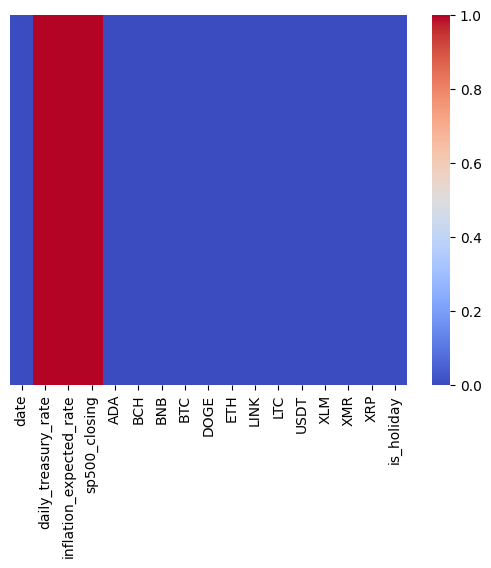

In [11]:
# heatmap of missing values with ytickslabels as date format mm-yyyy
sns.heatmap(df.isnull(), cmap='coolwarm', yticklabels=False)

In [12]:
# ffilling missing values in 'sp500_closing_data', 'inflation_rate', 'daily_treasury_rate' columns
df['sp500_closing'] = df['sp500_closing'].fillna(method='ffill')
df['inflation_expected_rate'] = df['inflation_expected_rate'].fillna(method='ffill')
df['daily_treasury_rate'] = df['daily_treasury_rate'].fillna(method='ffill')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2587 entries, 0 to 2586
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     2587 non-null   datetime64[ns]
 1   daily_treasury_rate      2587 non-null   float64       
 2   inflation_expected_rate  2587 non-null   float64       
 3   sp500_closing            2587 non-null   float64       
 4   ADA                      2587 non-null   float64       
 5   BCH                      2587 non-null   float64       
 6   BNB                      2587 non-null   float64       
 7   BTC                      2587 non-null   float64       
 8   DOGE                     2587 non-null   float64       
 9   ETH                      2587 non-null   float64       
 10  LINK                     2587 non-null   float64       
 11  LTC                      2587 non-null   float64       
 12  USDT                     2587 non-

In [14]:
# saving the cleaned dataset
df.to_csv('D:\\Advance-Time-Series-Prediction-W24\\2_DataEngineering\\no_nan_raw_data.csv', index=False)

In [15]:
# setting 'date' column as index
df.set_index('date', inplace=True)

## Feature Distributions and Possible Biases

[Plot the distribution of various features and target variables. Comment on the skewness, outliers, or any other observations.]

[Investigate the dataset for any biases that could affect the model’s performance and fairness (e.g., class imbalance, historical biases).]



In [16]:
df.columns

Index(['daily_treasury_rate', 'inflation_expected_rate', 'sp500_closing', 'ADA', 'BCH', 'BNB', 'BTC', 'DOGE', 'ETH', 'LINK', 'LTC', 'USDT', 'XLM', 'XMR', 'XRP', 'is_holiday'], dtype='object')

In [17]:
variables = ['daily_treasury_rate', 'inflation_expected_rate', 'sp500_closing',
             'BTC', 'ETH', 'BNB', 'USDT', 'ADA', 'XRP', 'DOGE', 'LTC', 'LINK', 'XLM', 'BCH', 'XMR']

                         Skewness Skewness Interpretation  Kurtosis  Kurtosis Interpretation Bias Test (p-value) P-Value Interpretation Distribution
daily_treasury_rate      0.436425           Symmetric      -1.239486        Platykurtic               0.0               Reject H0        Not Normal 
inflation_expected_rate -0.758766       Negative Skew       0.829551        Leptokurtic               0.0               Reject H0        Not Normal 
sp500_closing            0.402445           Symmetric        -0.7396        Platykurtic               0.0               Reject H0        Not Normal 
BTC                      0.868706       Positive Skew      -0.108818        Platykurtic               0.0               Reject H0        Not Normal 
ETH                      0.568475       Positive Skew      -0.806328        Platykurtic               0.0               Reject H0        Not Normal 
BNB                      0.544862       Positive Skew      -0.990423        Platykurtic               0.0 

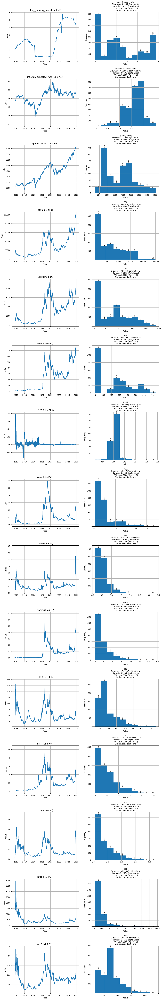

In [18]:
# Initialize an empty dictionary to store statistics and interpretations for each variable
stats_dict = {}

# Create a list to store the distribution results
distribution = []

# Compute statistical measures and interpretations for each variable
for col in variables:
    skew = df[col].skew()
    kurt = kurtosis(df[col], fisher=True)  # Fisher=True gives excess kurtosis
    _, p_value = normaltest(df[col].dropna())  # Test for normality (e.g., D’Agostino and Pearson’s test)

    # Interpret skewness
    if skew > 0.5:
        skew_interpretation = "Positive Skew"
    elif skew < -0.5:
        skew_interpretation = "Negative Skew"
    else:
        skew_interpretation = "Symmetric"

    # Interpret kurtosis
    if kurt > 0:
        kurt_interpretation = "Leptokurtic"
    elif kurt < 0:
        kurt_interpretation = "Platykurtic"
    else:
        kurt_interpretation = "Mesokurtic"

    # Interpret p-value
    p_value_interpretation = "Reject H0" if p_value < 0.05 else "Accept H0"
    
    # Add the distribution result based on the p-value
    if p_value >= 0.05:
        dist_interpretation = "Normal"
    else:
        dist_interpretation = "Not Normal"
    
    # Add to dictionary
    stats_dict[col] = {
        'Skewness': skew,
        'Skewness Interpretation': skew_interpretation,
        'Kurtosis': kurt,
        'Kurtosis Interpretation': kurt_interpretation,
        'Bias Test (p-value)': p_value,
        'P-Value Interpretation': p_value_interpretation,
        'Distribution': dist_interpretation  # New column for distribution
    }
    distribution.append(dist_interpretation)

# Create a DataFrame from the dictionary
stats_df = pd.DataFrame(stats_dict).T  # Transpose to get variables as rows
print(stats_df)

# Plotting line plots and histograms side by side
bins = 10
fig, axes = plt.subplots(len(variables), 2, figsize=(15, 100))

for i, col in enumerate(variables):
    # Plot the line chart
    axes[i, 0].plot(df.index, df[col], label=col)
    axes[i, 0].set_title(f"{col} (Line Plot)", fontsize=12)
    axes[i, 0].grid(True)
    axes[i, 0].set_ylabel('Value')
    axes[i, 0].set_xlabel('Year')

    # Compute skewness
    skewness = df[col].skew()
    kurtosis_value = kurtosis(df[col], fisher=True)
    p_value = normaltest(df[col].dropna())[1]
    
    # Get statistics from the dictionary
    skew = stats_dict[col]['Skewness']
    skew_interpretation = stats_dict[col]['Skewness Interpretation']
    kurt = stats_dict[col]['Kurtosis']
    kurt_interpretation = stats_dict[col]['Kurtosis Interpretation']
    p_value_interpretation = stats_dict[col]['P-Value Interpretation']
    dist_interpretation = stats_dict[col]['Distribution']
    
    # Plot histogram
    df[col].hist(bins=bins, ax=axes[i, 1])

    # Create the title with all statistics
    title = (f"{col}\n"
             f"Skewness: {skew:.4f} ({skew_interpretation})\n"
             f"Kurtosis: {kurt:.4f} ({kurt_interpretation})\n"
             f"P-Value: {p_value:.4f} ({p_value_interpretation})\n"
             f"Distribution: {dist_interpretation}")

    axes[i, 1].set_title(title, fontsize=10)
    axes[i, 1].set_xlabel("Value")
    axes[i, 1].set_ylabel("Frequency")
    
    # Display counts above each bar
    for container in axes[i, 1].containers:
        axes[i, 1].bar_label(container, rotation=90, fontsize=8)

# Adjust layout and add grid
plt.subplots_adjust(hspace=0.4, wspace=0.2)
plt.show()

## Possible Biases

[Investigate the dataset for any biases that could affect the model’s performance and fairness (e.g., class imbalance, historical biases).]


In [19]:
# Example: Checking for class imbalance in a classification problem
# sns.countplot(x='target_variable', data=df)

# Your code to investigate possible biases goes here


## Correlations

[Explore correlations between features and the target variable, as well as among features themselves.]


                        daily_treasury_rate inflation_expected_rate sp500_closing  BTC    ETH    BNB    USDT   ADA    XRP    DOGE   LTC    LINK   XLM    BCH    XMR  
daily_treasury_rate              1.00                  0.24               0.47      0.30   0.23   0.35  -0.08  -0.28  -0.06   0.04  -0.34  -0.18  -0.38  -0.24  -0.14
inflation_expected_rate          0.24                  1.00               0.61      0.58   0.73   0.68  -0.22   0.57   0.46   0.58   0.36   0.48   0.37   0.05   0.59
sp500_closing                    0.47                  0.61               1.00      0.92   0.87   0.92  -0.22   0.48   0.32   0.69   0.11   0.63   0.04  -0.22   0.32
BTC                              0.30                  0.58               0.92      1.00   0.91   0.92  -0.17   0.61   0.49   0.76   0.35   0.76   0.30   0.01   0.47
ETH                              0.23                  0.73               0.87      0.91   1.00   0.94  -0.19   0.76   0.55   0.82   0.42   0.77   0.34   0.03   0.58
BNB 

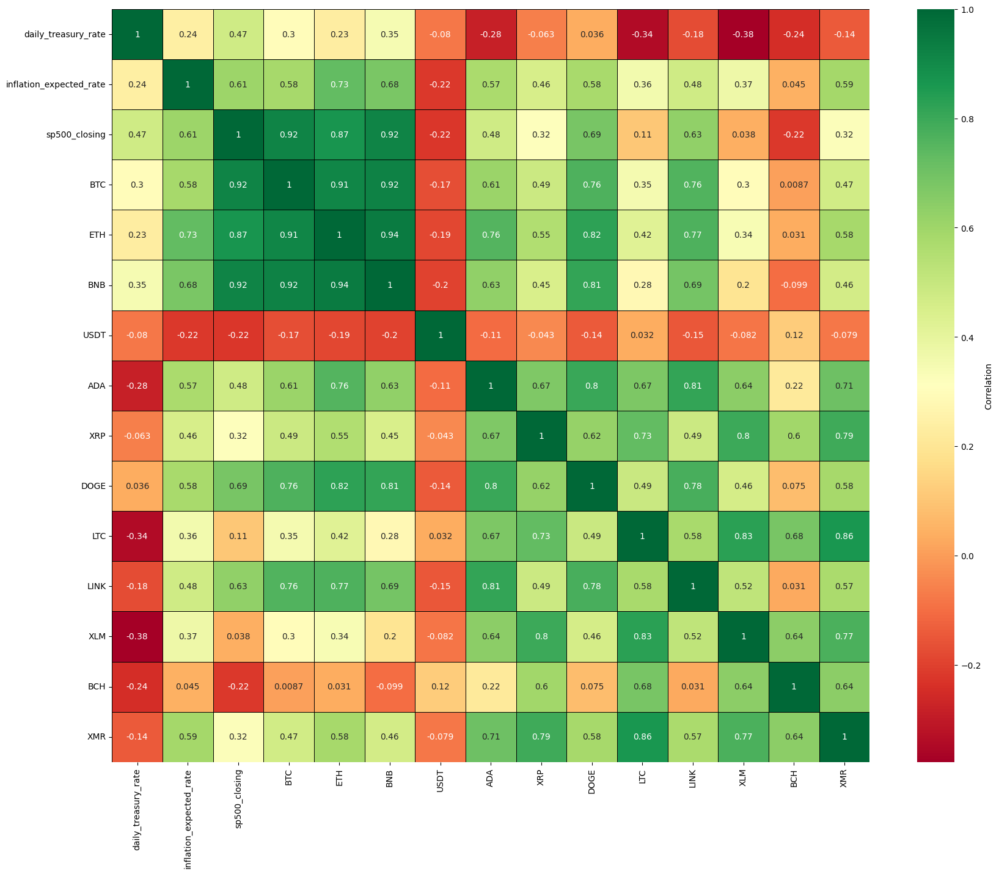

In [20]:
# Example: Plotting a heatmap to show feature correlations
plt.figure(figsize=(20, 16))  # Set the figure size
corr = df[['daily_treasury_rate', 'inflation_expected_rate', 'sp500_closing',
        'BTC', 'ETH', 'BNB', 'USDT', 'ADA', 'XRP', 'DOGE', 'LTC', 'LINK', 'XLM', 'BCH', 'XMR']].corr()
sns.heatmap(corr, cmap='RdYlGn', annot=True, linewidths=0.5, linecolor='black', cbar_kws={'label': 'Correlation'})
print(corr.map(nf_2))

# increasing the size of the heatmap
plt.show()

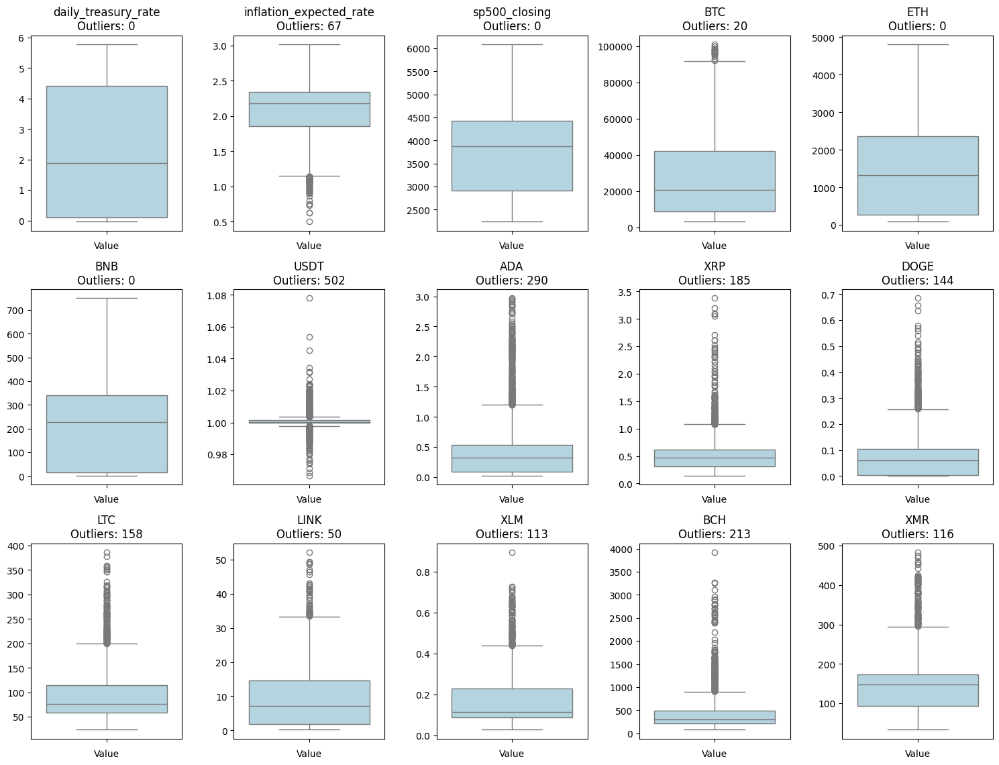

In [21]:
# Function to detect outliers using the IQR method
def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((data < lower_bound) | (data > upper_bound))

# Set up the plot grid (3x3 layout)
fig, axes = plt.subplots(4, 5, figsize=(15, 15))
axes = axes.flatten()

# Generate boxplots for each numeric column
for i, col in enumerate(variables):
    ax = axes[i]
    valid_data = df[col].dropna()  # Drop missing values
    sns.boxplot(y=valid_data, ax=ax, color='lightblue')  # Pass clean data

    # Detect and count outliers for the current column
    outliers = detect_outliers_iqr(df[col])  # Pass the individual column
    num_outliers = outliers.sum()

    # Annotate the plot with the number of outliers
    ax.set_title(f"{col}\nOutliers: {num_outliers}", fontsize=12)
    ax.set_xlabel('Value')
    ax.set_ylabel('')

# Hide unused subplots if columns < 9
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

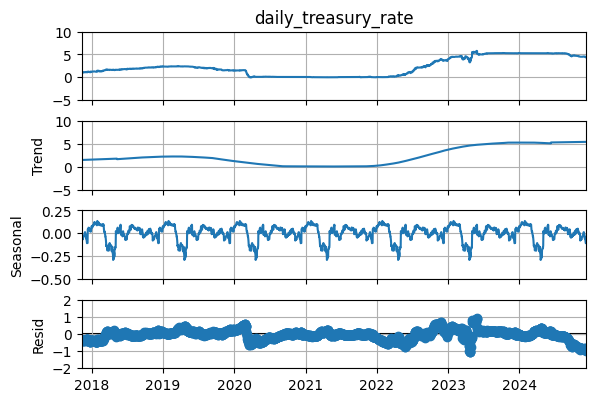

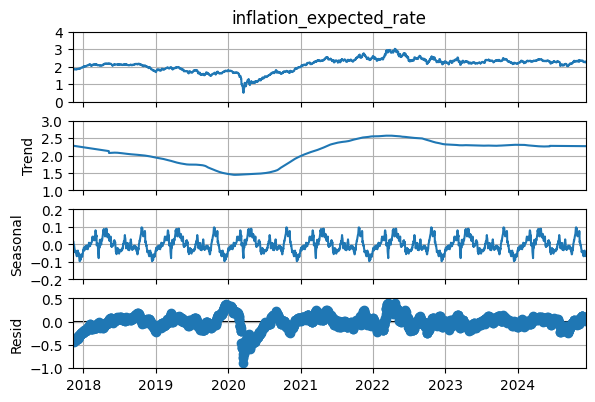

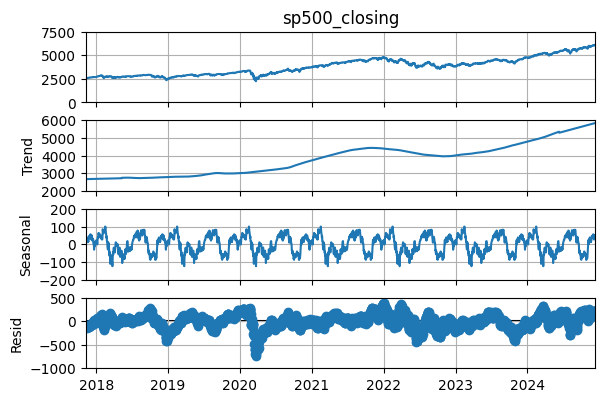

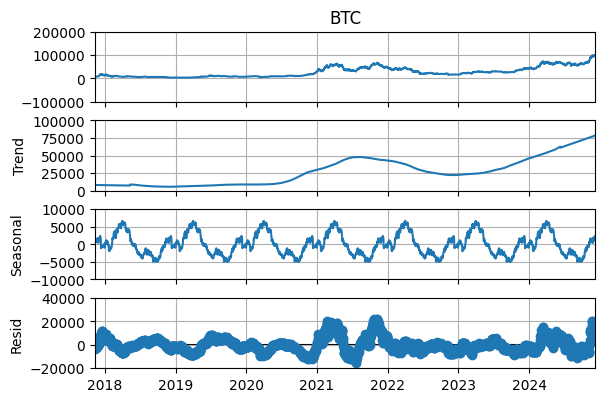

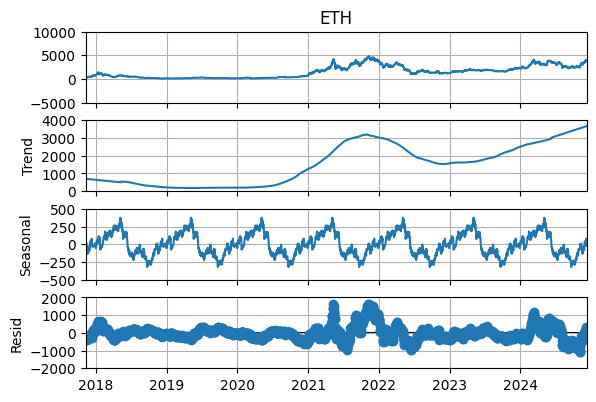

...

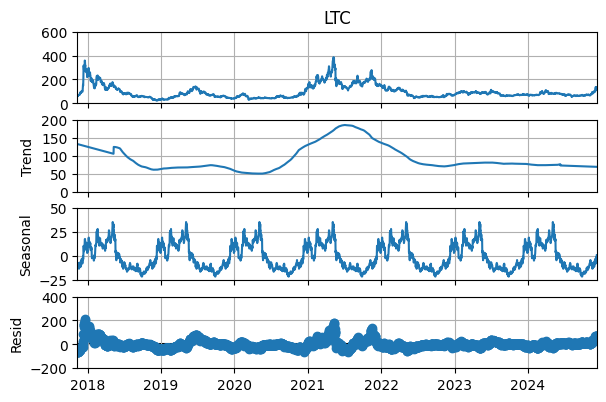

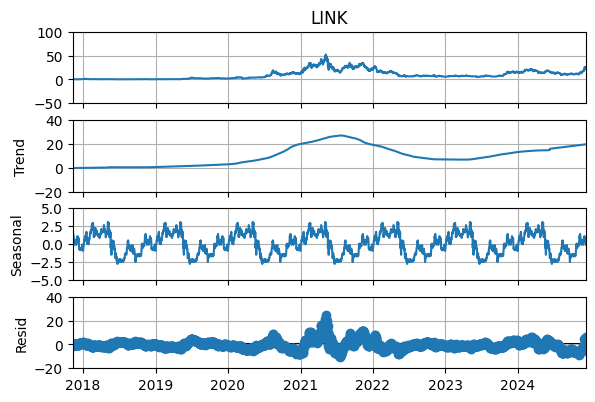

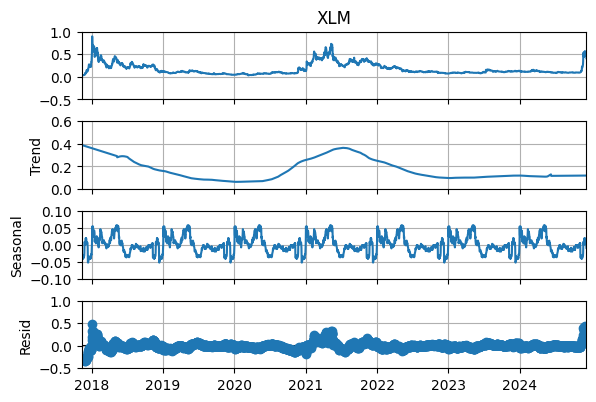

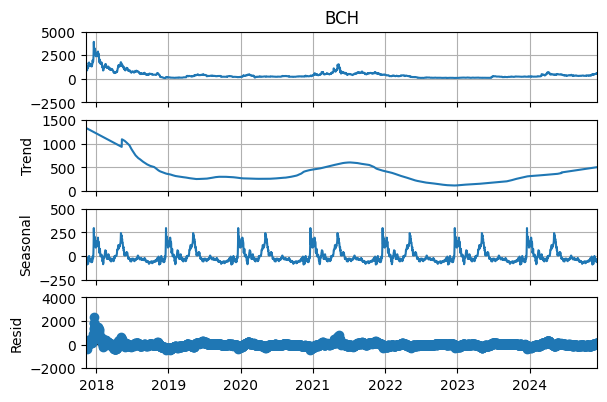

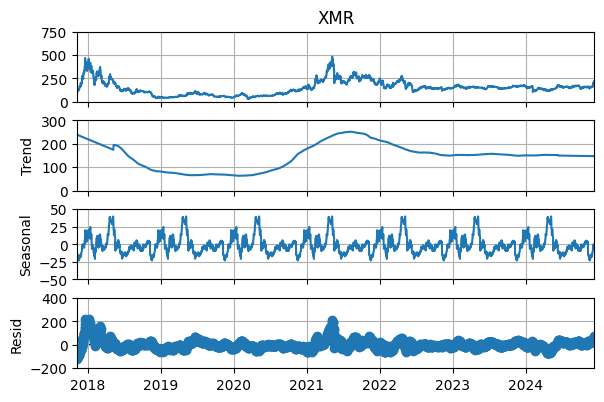

In [22]:
# Specify the period (assumes daily data with yearly seasonality, adjust as needed)
period = 365

# Initialize an empty dictionary to store residuals
residuals_dict = {}

# Iterate through each column to perform seasonal decomposition
for col in variables:
    
    # Perform seasonal decomposition (using additive model, as Multiplicative seasonality is not 
    #                                 appropriate for zero and negative values)
    result = seasonal_decompose(df[col], model='additive', period=period, extrapolate_trend='freq')

    # Plot the decomposition
    fig = result.plot()
    fig.set_size_inches(6, 4)  # Adjust figure size
    
    # Get the axes from the figure
    axes = fig.get_axes()

    # Iterate over each subplot axis (observed, trend, seasonal, residual)
    for ax in axes:
        ax.grid(True)  # Enable gridlines for all subplots
        ax.set_yticks(ax.get_yticks())  # Show y-ticks

# Remove empty subplots if there are fewer than 8 variables
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Display the plot
plt.show()

           Variable         Statistic  p-value  Distribution
0       daily_treasury_rate   0.9778   4.07e-18  not normal 
1   inflation_expected_rate   0.9318   1.00e-30  not normal 
2             sp500_closing   0.9747   2.10e-19  not normal 
3                       BTC   0.9595   1.99e-24  not normal 
4                       ETH   0.9027   1.91e-35  not normal 
5                       BNB   0.9148   1.23e-33  not normal 
6                      USDT   0.8065   1.30e-45  not normal 
7                       ADA   0.8432   2.33e-42  not normal 
8                       XRP   0.8791   1.61e-38  not normal 
9                      DOGE   0.7710   2.66e-48  not normal 
10                      LTC   0.8837   5.79e-38  not normal 
11                     LINK   0.9113   3.50e-34  not normal 
12                      XLM   0.8963   2.44e-36  not normal 
13                      BCH   0.9145   1.09e-33  not normal 
14                      XMR   0.8832   5.04e-38  not normal 


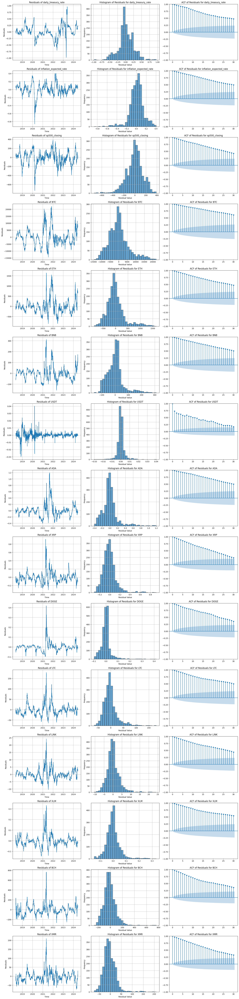

In [23]:
# Initialize a list to store Shapiro-Wilk test results
shapiro_results = []

# Set the number of subplots (3 columns: residuals plot, histogram, ACF, 1 row for each variable)
n_cols = 3
n_rows = len(variables)  # Number of rows will be equal to the number of variables

# Create subplots for each variable (3 plots in each row)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

# Loop through each column
for i, col in enumerate(variables):
    # Decompose the time series for the current column
    decomposition = seasonal_decompose(df[col], model='additive', period=365)  # Period=365 assuming daily data with yearly seasonality
    
    # Extract residuals
    residuals = decomposition.resid.dropna()  # Drop NA for cleaner residuals

    # Plot residuals over time (first plot in the row)
    axes[i * 3].plot(residuals)
    axes[i * 3].set_title(f'Residuals of {col}')
    axes[i * 3].set_xlabel('Time')
    axes[i * 3].set_ylabel('Residuals')
    axes[i * 3].grid(True)

    # Perform Shapiro-Wilk test for normality
    stat, p_value = shapiro(residuals)  # Use scipy.stats.shapiro
    normality = "normal" if p_value > 0.05 else "not normal"

    # Format the p-value and statistic
    p_value_scientific = "{:.2e}".format(p_value)
    stat_rounded = "{:.4f}".format(stat)

    # Append results to the table data
    shapiro_results.append({
        "Variable": col,
        "Statistic": stat_rounded,
        "p-value": p_value_scientific,
        "Distribution": normality
    })

    # Plot histogram of residuals (second plot in the row)
    axes[i * 3 + 1].hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    axes[i * 3 + 1].set_title(f'Histogram of Residuals for {col}')
    axes[i * 3 + 1].set_xlabel('Residual Value')
    axes[i * 3 + 1].set_ylabel('Frequency')
    axes[i * 3 + 1].grid(True)

    # Plot ACF of residuals (third plot in the row)
    plot_acf(residuals, lags=30, ax=axes[i * 3 + 2])
    axes[i * 3 + 2].set_title(f'ACF of Residuals for {col}')

# Convert the Shapiro-Wilk test results to a DataFrame and display as a table
shapiro_df = pd.DataFrame(shapiro_results)
print(shapiro_df)

# Adjust layout for better spacing between plots
plt.tight_layout()
plt.show()


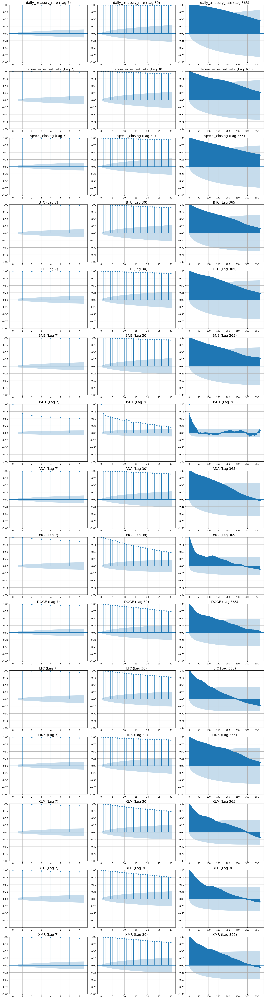

In [24]:
# Create a figure with subplots (4 rows and 3 columns for 8 variables)
fig, axes = plt.subplots(nrows=len(variables), ncols=3, figsize=(20, len(variables)*5))
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Define the lags for weekly, monthly, and yearly seasonality
lags_list = [7, 30, 365]  # lags corresponding to weekly, monthly, and yearly

# Iterate through each variable and plot its ACF for the specified lags
for i, col in enumerate(variables):
    for j, lag in enumerate(lags_list):
        # Plot ACF for each variable at the given lag
        plot_acf(df[col], lags=lag, ax=axes[i*3 + j])  # Calculate ACF for current lag
        axes[i*3 + j].set_title(f"{col} (Lag {lag})", fontsize=18)  # Increase axis title font size
        axes[i*3 + j].grid(True)

        # Increase font size of x and y ticks
        axes[i*3 + j].tick_params(axis='both', which='major', labelsize=12)  # x and y ticks font size

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

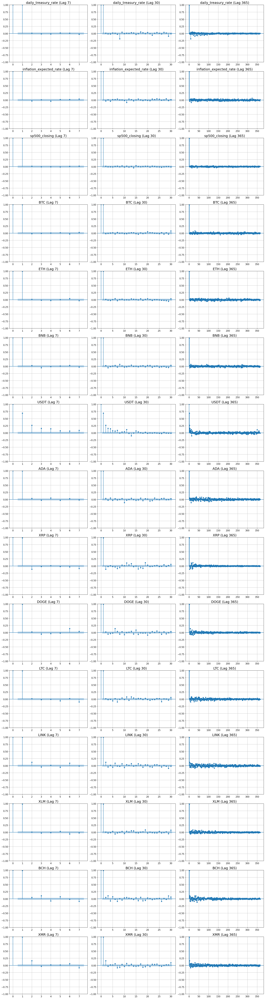

In [25]:
# Create a figure with subplots (4 rows and 3 columns for each variable's PACF)
fig, axes = plt.subplots(nrows=len(variables), ncols=3, figsize=(20, len(variables)*5))
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Define the lags for weekly, monthly, and yearly seasonality
lags_list = [7, 30, 365]  # lags corresponding to weekly, monthly, and yearly

# Iterate through each variable and plot its PACF for the specified lags
for i, col in enumerate(variables):
    for j, lag in enumerate(lags_list):
        # Plot PACF for each variable at the given lag
        plot_pacf(df[col], lags=lag, ax=axes[i*3 + j])  # Calculate PACF for current lag
        axes[i*3 + j].set_title(f"{col} (Lag {lag})", fontsize=18)  # Increase axis title font size
        axes[i*3 + j].grid(True)

        # Increase font size of x and y ticks
        axes[i*3 + j].tick_params(axis='both', which='major', labelsize=12)  # x and y ticks font size

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

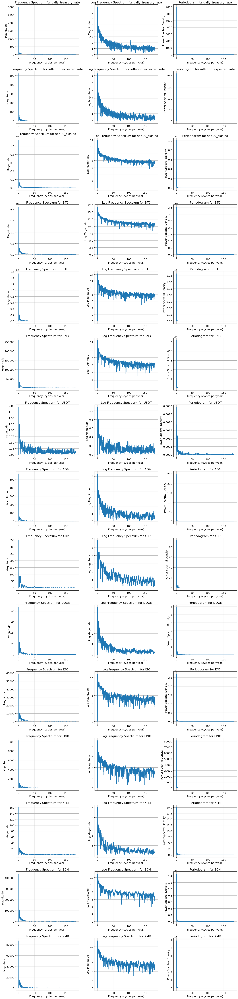

In [26]:
# Set up the figure and grid
n_cols = 3  # 3 plots per row (Frequency Spectrum, Log Frequency Spectrum, and Periodogram)
n_rows = len(variables)  # One row for each variable
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, len(variables) * 5))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Loop through each variable and compute the required plots
for i, var in enumerate(variables):
    # Extract data and drop missing values
    data = df[var].dropna()
    
    # Subtract mean to center the data
    data_centered = data - data.mean()
    
    # Perform Fourier Transform
    fft_result = np.fft.fft(data_centered)
    
    # Calculate corresponding frequencies
    freqs = np.fft.fftfreq(len(data_centered), d=1)  # d=1 assumes daily data
    
    # Convert frequency to cycles per year
    freqs_per_year = freqs * 365  # Multiply by 365 to convert to frequency per year
    
    # Get magnitude of the FFT
    magnitude = np.abs(fft_result)
    
    # Plot Frequency Spectrum
    axes[i * 3].plot(freqs_per_year[:len(freqs)//2], magnitude[:len(freqs)//2])  # Only positive frequencies
    axes[i * 3].set_title(f'Frequency Spectrum for {var}', fontsize=16)
    axes[i * 3].set_xlabel('Frequency (cycles per year)', fontsize=14)
    axes[i * 3].set_ylabel('Magnitude', fontsize=14)
    axes[i * 3].tick_params(axis='both', labelsize=14)  # Set x and y tick labels font size
    axes[i * 3].grid(True)

    # Apply log transformation to magnitudes for Log Frequency Spectrum
    magnitude_log = np.log1p(magnitude[:len(freqs)//2])  # log1p to handle 0 safely
    
    # Plot Log Frequency Spectrum
    axes[i * 3 + 1].plot(freqs_per_year[:len(freqs)//2], magnitude_log)
    axes[i * 3 + 1].set_title(f'Log Frequency Spectrum for {var}', fontsize=16)
    axes[i * 3 + 1].set_xlabel('Frequency (cycles per year)', fontsize=14)
    axes[i * 3 + 1].set_ylabel('Log Magnitude', fontsize=14)
    axes[i * 3 + 1].tick_params(axis='both', labelsize=14)  # Set x and y tick labels font size
    axes[i * 3 + 1].grid(True)

    # Calculate frequencies and power spectral density for Periodogram
    freqs, power = periodogram(data, fs=1)  # fs=1 assumes daily sampling
    
    # Convert periodogram frequency to cycles per year
    freqs_per_year_periodogram = freqs * 365  # Multiply by 365 to convert to frequency per year
    
    # Plot Periodogram
    axes[i * 3 + 2].plot(freqs_per_year_periodogram, power)
    axes[i * 3 + 2].set_title(f"Periodogram for {var}", fontsize=16)
    axes[i * 3 + 2].set_xlabel("Frequency (cycles per year)", fontsize=14)
    axes[i * 3 + 2].set_ylabel("Power Spectral Density", fontsize=14)
    axes[i * 3 + 2].tick_params(axis='both', labelsize=14)  # Set x and y tick labels font size
    axes[i * 3 + 2].grid(True)

# Adjust layout to avoid overlap and display
plt.tight_layout()
plt.show()

In [27]:
# Initialize an empty list to store results
adf_results = {}

# Loop through each variable in the DataFrame
for col in variables:
    # Perform Dickey-Fuller test
    dftest = adfuller(df[col], autolag='AIC')

    # Collect all the results from the ADF test
    adf_results[col] = {
        'Test Stats': dftest[0],  # ADF Test Statistic
        'p-value': dftest[1],  # p-value of the test
        'Number of Lags': dftest[2],  # Number of lags used in the test
        'Number of Used Observations': dftest[3],  # Number of observations used
        'Critical Value (1%)': dftest[4]['1%'],  # Critical value for 1% significance level
        'Critical Value (5%)': dftest[4]['5%'],  # Critical value for 5% significance level
        'Critical Value (10%)': dftest[4]['10%'],  # Critical value for 10% significance level
        'H0 Decision': 'Reject' if dftest[1] < 0.05 else 'Accept',  # H0 decision based on p-value
        'Stationary': 'Yes' if dftest[1] < 0.05 else 'No'  # Stationarity based on p-value
    }

# Convert the dictionary into a DataFrame
adf_results_df = pd.DataFrame(adf_results)

# Display the result table
print(adf_results_df.T)

                        Test Stats  p-value  Number of Lags Number of Used Observations Critical Value (1%) Critical Value (5%) Critical Value (10%) H0 Decision Stationary
daily_treasury_rate     -0.469043   0.897917       28                   2558                 -3.432909           -2.862671           -2.567372          Accept        No   
inflation_expected_rate -1.995845   0.288398       11                   2575                 -3.432892           -2.862663           -2.567368          Accept        No   
sp500_closing            0.233847   0.974097       14                   2572                 -3.432895           -2.862664           -2.567369          Accept        No   
BTC                       0.07362   0.964213       28                   2558                 -3.432909           -2.862671           -2.567372          Accept        No   
ETH                     -1.384572    0.58965       28                   2558                 -3.432909           -2.862671           -2.5673

In [28]:
# Initialize an empty list to store results
kpss_results = {}

# Loop through each variable in the DataFrame
for col in variables:
    # Perform KPSS test
    kpsstest = kpss(df[col], regression='c', nlags='auto')  # 'c' for level stationarity

    # Collect all the results from the KPSS test
    kpss_results[col] = {
        'Test Stats': kpsstest[0],  # KPSS Test Statistic
        'p-value': kpsstest[1],  # p-value of the test
        'Number of Lags': kpsstest[2],  # Number of lags used in the test
        'Critical Value (10%)': kpsstest[3]['10%'],  # Critical value for 10% significance level
        'Critical Value (5%)': kpsstest[3]['5%'],  # Critical value for 5% significance level
        'Critical Value (1%)': kpsstest[3]['1%'],  # Critical value for 1% significance level
        'H0 Decision': 'Reject' if kpsstest[1] < 0.05 else 'Accept',  # H0 decision based on p-value
        'Stationary': 'No' if kpsstest[1] < 0.05 else 'Yes'  # Stationarity based on p-value
    }

# Convert the dictionary into a DataFrame
kpss_results_df = pd.DataFrame(kpss_results)

# Display the result table
print(kpss_results_df.T)

                        Test Stats  p-value  Number of Lags Critical Value (10%) Critical Value (5%) Critical Value (1%) H0 Decision Stationary
daily_treasury_rate      4.225629       0.01       30               0.347                0.463               0.739          Reject       No    
inflation_expected_rate  3.238752       0.01       30               0.347                0.463               0.739          Reject       No    
sp500_closing             7.18812       0.01       30               0.347                0.463               0.739          Reject       No    
BTC                      4.993137       0.01       30               0.347                0.463               0.739          Reject       No    
ETH                      4.928691       0.01       30               0.347                0.463               0.739          Reject       No    
BNB                      5.823852       0.01       30               0.347                0.463               0.739          Reject      

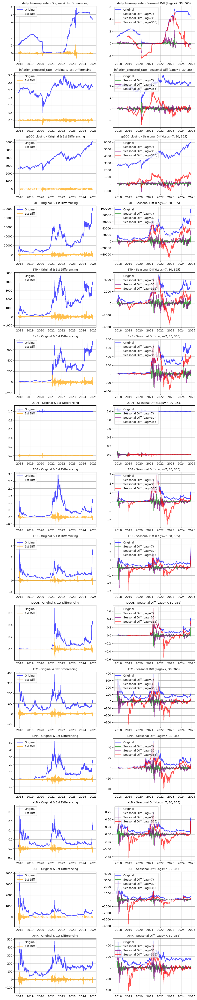

In [29]:
# Create a function to plot differencing and seasonal differencing for multiple lags
def plot_differencing(df, variables, seasonal_lags):
    n_cols = 2
    n_rows = len(variables)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(10, 50))
    
    for i, var in enumerate(variables):
        data = df[var].dropna()
        
        # Perform first differencing
        diff_1 = data.diff().dropna()
        
        # Perform seasonal differencing for each lag (7, 30, 365)
        diff_seasonal_7 = data.diff(7).dropna()
        diff_seasonal_30 = data.diff(30).dropna()
        diff_seasonal_365 = data.diff(365).dropna()
        
        # Plot original data and 1st differencing
        axes[i, 0].plot(data, label='Original', color='blue', alpha=0.7)
        axes[i, 0].plot(diff_1, label='1st Diff', color='orange', alpha=0.7)
        axes[i, 0].set_title(f"{var} - Original & 1st Differencing", fontsize=10)
        axes[i, 0].legend(loc='upper left')
        axes[i, 0].grid()
        
        # Plot seasonal differencing for multiple lags (7, 30, 365)
        axes[i, 1].plot(data, label='Original', color='blue', alpha=0.7)
        axes[i, 1].plot(diff_seasonal_7, label='Seasonal Diff (Lag=7)', color='green', alpha=0.7)
        axes[i, 1].plot(diff_seasonal_30, label='Seasonal Diff (Lag=30)', color='purple', alpha=0.7)
        axes[i, 1].plot(diff_seasonal_365, label='Seasonal Diff (Lag=365)', color='red', alpha=0.7)
        axes[i, 1].set_title(f"{var} - Seasonal Diff (Lags=7, 30, 365)", fontsize=10)
        axes[i, 1].legend(loc='upper left')
        axes[i, 1].grid()

    plt.tight_layout()
    plt.show()

# Define seasonal lags to consider
seasonal_lags = [7, 30, 365]  # Lags for weekly, monthly, and yearly seasonality

# Plot differencing for all variables with the defined seasonal lags
plot_differencing(df, variables, seasonal_lags)

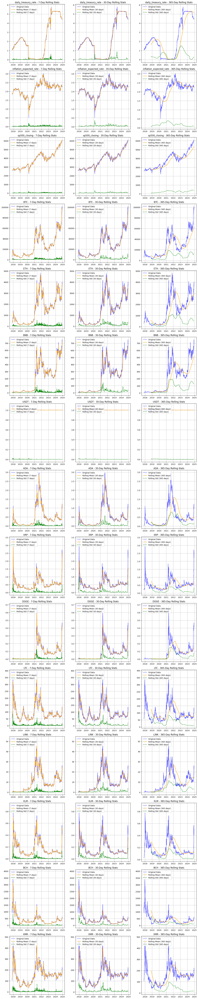

In [30]:
# Function to plot rolling statistics
def plot_rolling_stats(df, variables, windows):
    n_cols = len(windows)
    n_rows = len(variables)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5 * n_cols, 5 * n_rows))
    
    for i, var in enumerate(variables):
        data = df[var].dropna()
        
        for j, window in enumerate(windows):
            rolling_mean = data.rolling(window=window).mean()
            rolling_std = data.rolling(window=window).std()
            
            ax = axes[i, j] if n_rows > 1 else axes[j]
            ax.plot(data, label='Original Data', color='blue', alpha=0.6)
            ax.plot(rolling_mean, label=f'Rolling Mean ({window} days)', color='orange')
            ax.plot(rolling_std, label=f'Rolling Std ({window} days)', color='green', linestyle='--')
            
            ax.set_title(f"{var} - {window}-Day Rolling Stats")
            ax.legend(loc='upper left')
            ax.grid()
    
    plt.tight_layout()
    plt.show()

# Define rolling windows (e.g., 7-day, 30-day, and 365-day)
rolling_windows = [7, 30, 365]

# Plot rolling statistics for all variables
plot_rolling_stats(df, variables, rolling_windows)

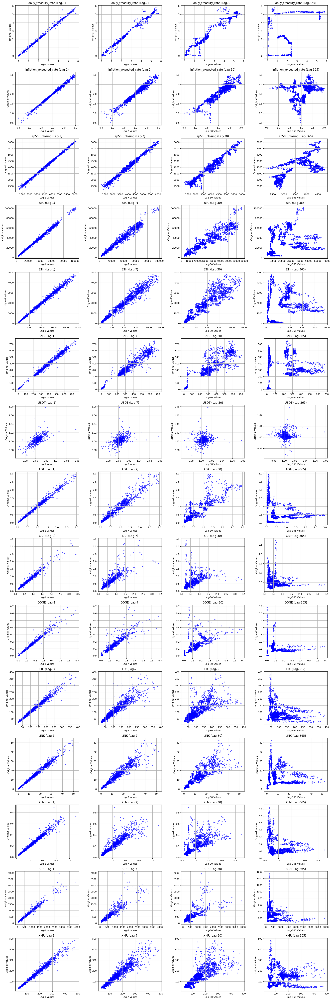

In [31]:
# Lags to plot
lags = [1, 7, 30, 365]

# Function to plot scatter plots for series vs. lagged values in a grid
def plot_lag_scatter_grid(df, variables, lags):
    n_rows = len(variables)  # Rows: one for each variable
    n_cols = len(lags)       # Columns: one for each lag
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5 * n_cols, 4 * n_rows))
    
    for i, var in enumerate(variables):
        data = df[var].dropna()
        
        for j, lag in enumerate(lags):
            lagged_data = data.shift(lag).dropna()
            original_data = data[lag:]  # Align lengths with lagged data
            
            ax = axes[i, j] if n_rows > 1 else axes[j]
            ax.scatter(lagged_data, original_data, alpha=0.6, color='blue', s=10)
            ax.set_title(f"{var} (Lag-{lag})")
            ax.set_xlabel(f"Lag-{lag} Values")
            ax.set_ylabel("Original Values")
            ax.grid()
    
    plt.tight_layout()
    plt.show()

# Plot scatter plots in grid format
plot_lag_scatter_grid(df, variables, lags)

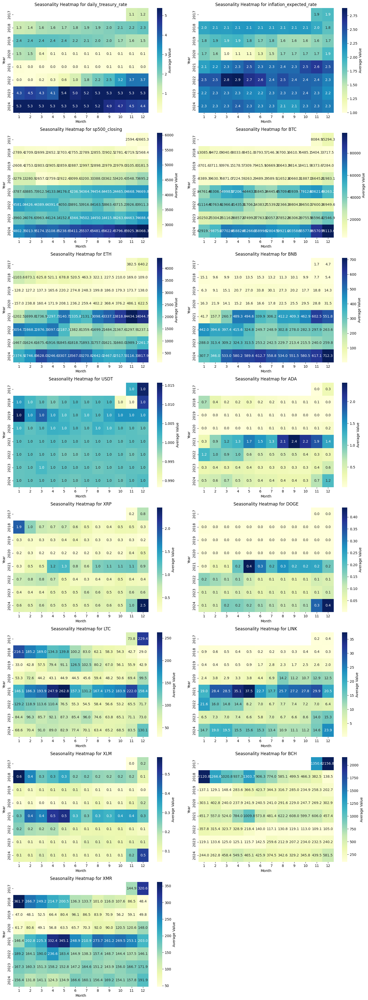

In [32]:
# Create a grid of subplots
n_cols = 2
n_rows = (len(variables) + 1) // 2
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# Loop through variables to plot each heatmap
for i, variable in enumerate(variables):
    # Group data by year and month and calculate the mean
    grouped = df[variable].groupby([df.index.year, df.index.month]).mean().unstack()
    
    # Create heatmap
    sns.heatmap(
        grouped, 
        cmap="YlGnBu", 
        annot=True, 
        fmt=".1f", 
        ax=axes[i], 
        cbar_kws={'label': 'Average Value'},
    )
    axes[i].set_title(f"Seasonality Heatmap for {variable}")
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Year')

# Remove unused subplots
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

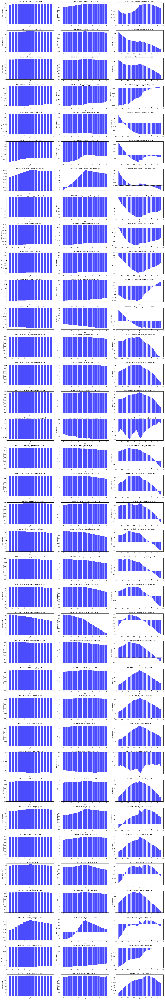

In [33]:
# List of independent variables
independent_vars = ['daily_treasury_rate',
                    'inflation_expected_rate',
                    'sp500_closing']

# List of target variables
target_vars = ['BTC', 'ETH', 'BNB', 'USDT', 'ADA', 'XRP', 'DOGE', 'LTC', 'LINK', 'XLM', 'BCH', 'XMR']

# Define the specific lags to plot (7, 30, 365)
lags_to_plot = [7, 30, 365]

# Calculate the total number of plots
n_cols = len(lags_to_plot)  # One column for each lag range
n_rows = len(independent_vars) * len(target_vars)  # One row for each independent-target pair
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 3 * n_rows))
axes = axes.flatten()

# Plot counter to manage subplot indexing
plot_counter = 0

# Loop through each combination of independent and target variables
for independent_var in independent_vars:
    for target_var in target_vars:
        independent = df[independent_var]
        target = df[target_var]

        # Drop NA to avoid misalignment issues
        target_aligned = target.dropna()
        independent_aligned = independent.dropna()
        min_len = min(len(target_aligned), len(independent_aligned))
        target_aligned = target_aligned.iloc[:min_len]
        independent_aligned = independent_aligned.iloc[:min_len]

        # Compute cross-correlation
        cross_corr = np.correlate(
            target_aligned - np.mean(target_aligned),
            independent_aligned - np.mean(independent_aligned),
            mode='full'
        )
        cross_corr = cross_corr / (np.std(target_aligned) * np.std(independent_aligned) * len(target_aligned))
        lags = np.arange(-len(target_aligned) + 1, len(target_aligned))

        # Plot CCF for each specified range of lags
        for j, max_lag in enumerate(lags_to_plot):
            # Get cross-correlation values for lags up to max_lag
            lag_indices = (lags >= -max_lag) & (lags <= max_lag)
            cross_corr_values = cross_corr[lag_indices]
            lag_values = lags[lag_indices]

            # Plot the CCF values
            ax = axes[plot_counter]  # Get the correct axis
            ax.bar(lag_values, cross_corr_values, color='blue', alpha=0.7)
            ax.set_title(f"CCF: {target_var} vs. {independent_var} (Lag ≤ {max_lag})", fontsize=10)
            ax.set_xlabel("Lag", fontsize=8)
            ax.set_ylabel("Cross-Correlation", fontsize=8)
            ax.axhline(0, color='black', linewidth=0.8, linestyle='--')  # Baseline
            ax.tick_params(axis='both', labelsize=7)

            plot_counter += 1  # Increment subplot index

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

           Variable          Cluster
0       daily_treasury_rate     3   
1   inflation_expected_rate     2   
2             sp500_closing     2   
3                       BTC     0   
4                       ETH     0   
5                       BNB     0   
6                      USDT     2   
7                       ADA     0   
8                       XRP     1   
9                      DOGE     0   
10                      LTC     1   
11                     LINK     0   
12                      XLM     1   
13                      BCH     1   
14                      XMR     1   


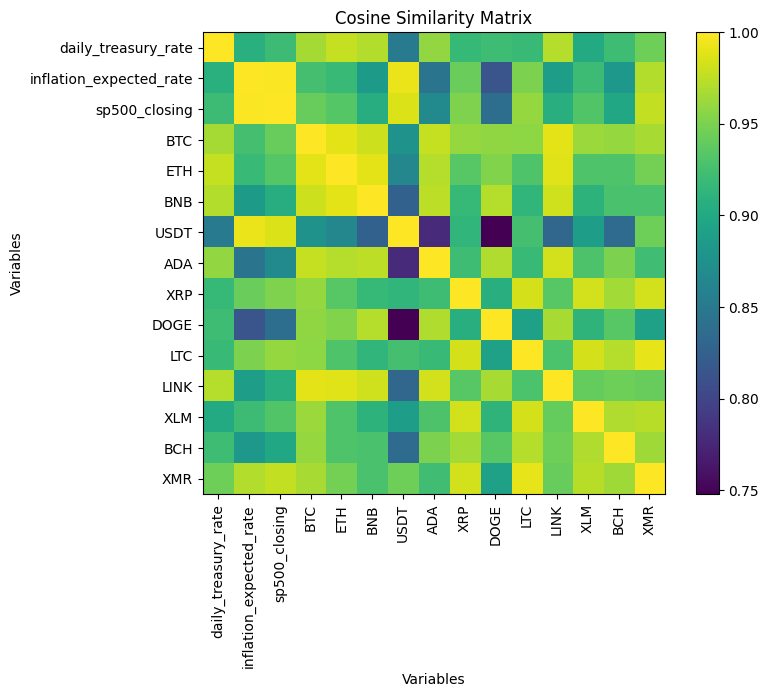

In [34]:
# Example DataFrame
data = df[['daily_treasury_rate',
           'inflation_expected_rate',
           'sp500_closing',
           'BTC',
           'ETH',
           'BNB',
           'USDT',
           'ADA',
           'XRP',
           'DOGE',
           'LTC',
           'LINK',
           'XLM',
           'BCH',
           'XMR']]

# Step 1: Transpose the data so rows become columns (time points for each variable)
data_transposed = data.T

# Step 2: Perform FFT for each variable
fft_results = {}
for variable in data_transposed.index:
    fft_result = np.fft.fft(data_transposed.loc[variable])  # Perform FFT
    fft_magnitude = np.abs(fft_result)  # Magnitude of the FFT
    fft_results[variable] = fft_magnitude[:len(fft_magnitude) // 2]  # Keep positive frequencies

# Step 3: Create FFT Matrix (each row corresponds to a variable, each column is a frequency component)
fft_matrix = np.array(list(fft_results.values()))

# Step 4: Compute Cosine Similarity between rows of the FFT matrix
similarity_matrix = cosine_similarity(fft_matrix)

# Step 5: Apply Spectral Clustering on the similarity matrix
n_clusters = 4  # You can decide the number of clusters based on domain knowledge or experiment
spectral = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=42)
cluster_labels = spectral.fit_predict(similarity_matrix)

# Step 6: Map clusters back to variables
clusters = pd.DataFrame({'Variable': fft_results.keys(), 'Cluster': cluster_labels})

# Print cluster assignments
print(clusters)

# Step 7: Visualize the Similarity Matrix
plt.figure(figsize=(8, 6))
plt.imshow(similarity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title('Cosine Similarity Matrix')
plt.xlabel('Variables')
plt.ylabel('Variables')
plt.xticks(range(len(fft_results)), fft_results.keys(), rotation=90)
plt.yticks(range(len(fft_results)), fft_results.keys())
plt.show()

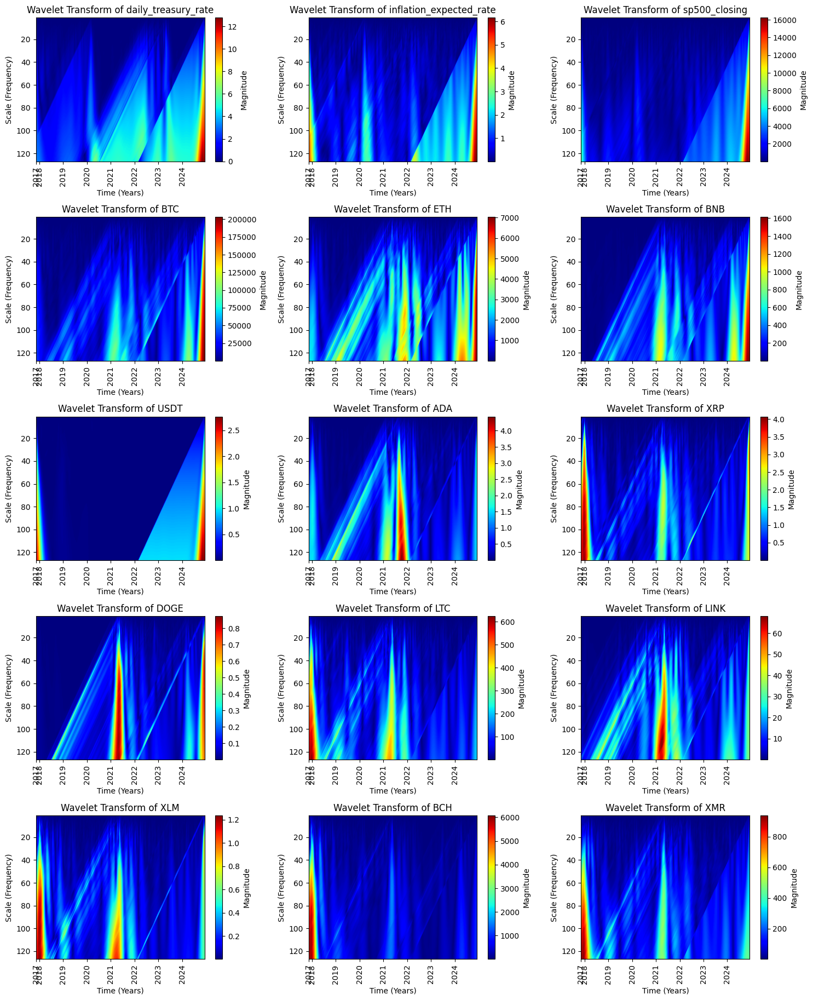

In [35]:
# Number of rows and columns in the grid
n_rows = 7
n_cols = 3

# Create a n_rows x n_cols grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 25))

# Flatten axes array to easily iterate through
axes = axes.flatten()

# Loop through each variable in the list and plot on the corresponding subplot
for i, variable in enumerate(variables):
    # Get the data for the current variable (handling NaNs)
    data = df[variable].dropna().values  # Remove NaN values
    time = df[variable].dropna().index  # Get the corresponding time index (dates)
    
    # Define the wavelet function and scales
    wavelet = 'cmor'  # Complex Morlet wavelet (widely used for time-frequency analysis)
    scales = np.arange(1, 128)  # Scale range for analysis
    
    # Perform the Continuous Wavelet Transform (CWT)
    coefficients, frequencies = pywt.cwt(data, scales, wavelet)
    
    # Plotting the CWT result for the current variable on the correct subplot
    ax = axes[i]  # Select the correct subplot axis
    
    # Create a heatmap of the wavelet coefficients
    c = ax.imshow(abs(coefficients), extent=[0, len(data), scales[-1], scales[0]], aspect='auto', cmap='jet')

    # Add labels and titles
    ax.set_title(f'Wavelet Transform of {variable}')
    ax.set_xlabel('Time (Years)')
    ax.set_ylabel('Scale (Frequency)')
    fig.colorbar(c, ax=ax, label='Magnitude')  # Add color bar to each plot
    
    # Set x-ticks to show each year once
    year_labels = np.unique(time.year)  # Get unique years
    year_positions = [np.where(time.year == year)[0][0] for year in year_labels]  # Get positions of each year
    ax.set_xticks(year_positions)
    ax.set_xticklabels(year_labels)  # Set x-ticks to show each year label
    ax.tick_params(axis='x', rotation=90)

    ax.grid(False)  # Disable grid on the plots

# Hide unused subplots
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

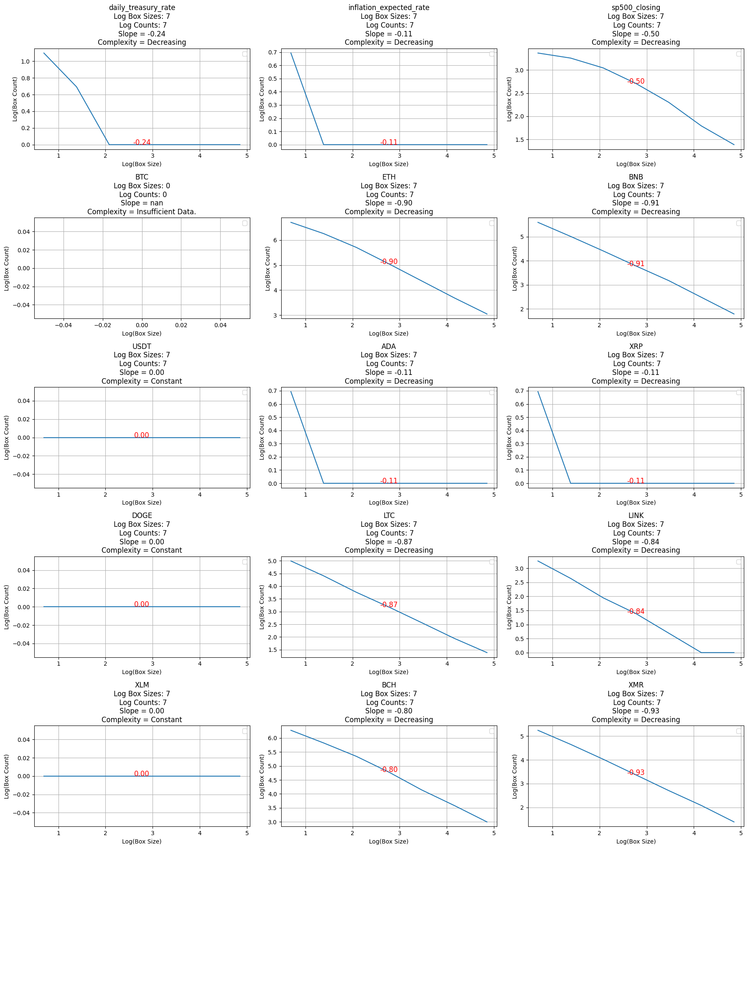

In [36]:
# Example DataFrame
data = df[['daily_treasury_rate',
           'inflation_expected_rate',
           'sp500_closing',
           'BTC',
           'ETH',
           'BNB',
           'USDT',
           'ADA',
           'XRP',
           'DOGE',
           'LTC',
           'LINK',
           'XLM',
           'BCH',
           'XMR']]

# Check if all variables are present in the dataset
missing_vars = [var for var in variables if var not in data]
if missing_vars:
    raise ValueError(f"The following variables are missing in the dataset: {missing_vars}")

# Create a dictionary for easy access
data_dict = {var: data[var].dropna().values for var in variables}

# Define the box-counting method
def box_count(data, box_size):
    """
    Counts the number of non-empty boxes when dividing the data into boxes of size 'box_size'.
    """
    bins = np.arange(0, len(data) + box_size, box_size)
    counts, _ = np.histogram(data, bins=bins)
    return np.sum(counts > 0)

# Compute fractal dimension
def fractal_dimension(data, box_sizes):
    """
    Computes the fractal dimension for a given time series data using a range of box sizes.
    """
    log_box_sizes = []
    log_counts = []
    
    for box_size in box_sizes:
        count = box_count(data, box_size)
        if count > 0:  # Avoid log(0)
            log_box_sizes.append(np.log(box_size))
            log_counts.append(np.log(count))
    
    return log_box_sizes, log_counts

# Define box sizes to test
box_sizes = [2, 4, 8, 16, 32, 64, 128]

# Create a 6x3 grid for individual plots
fig, axes = plt.subplots(6, 3, figsize=(18, 24))
axes = axes.flatten()

for i, (var, values) in enumerate(data_dict.items()):
    # Compute fractal dimensions
    log_box_sizes, log_counts = fractal_dimension(values, box_sizes)
    
    # Ensure valid data for regression
    if len(log_box_sizes) > 1 and len(log_counts) > 1:
        reg = LinearRegression()
        X = np.array(log_box_sizes).reshape(-1, 1)
        y = np.array(log_counts)
        reg.fit(X, y)
        slope = reg.coef_[0]
    else:
        slope = np.nan  # Cannot compute slope with insufficient data

    # Interpret slope value
    if not np.isnan(slope):
        if slope > 0:
            interpretation = "Increasing"
        elif slope < 0:
            interpretation = "Decreasing"
        else:
            interpretation = "Constant"
    else:
        interpretation = "Insufficient Data."

    # Plot the data
    ax = axes[i]
    ax.plot(log_box_sizes, log_counts)
    ax.set_title(f"{var}\nLog Box Sizes: {len(log_box_sizes)}\n Log Counts: {len(log_counts)}\nSlope = {slope:.2f}\nComplexity = {interpretation}")
    ax.set_xlabel('Log(Box Size)')
    ax.set_ylabel('Log(Box Count)')
    ax.legend()
    ax.grid(True)
    
    # Annotate the slope on the line
    if not np.isnan(slope):
        mid_idx = len(log_box_sizes) // 2
        ax.text(log_box_sizes[mid_idx], log_counts[mid_idx], f'{slope:.2f}', 
                fontsize=12, color='red', ha='center')

# Hide unused subplots if variables < 18
for j in range(len(variables), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

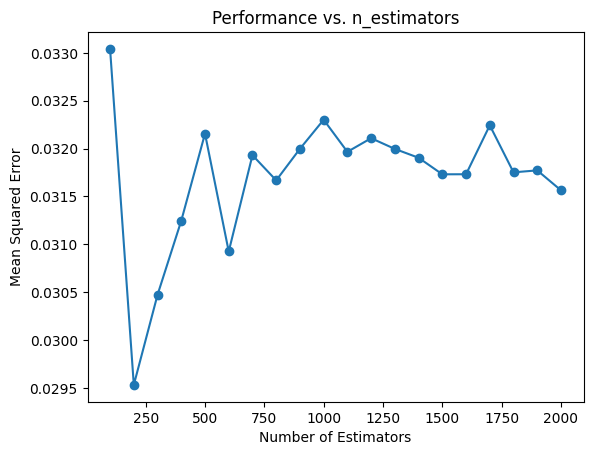

In [37]:
# List of possible n_estimators to test
n_estimators_list = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000]
mse_scores = []

# Loop through each value of n_estimators
for n in n_estimators_list:
    rf_model = RandomForestRegressor(n_estimators=n, random_state=42)
    rf_model.fit(X, y)
    y_pred = rf_model.predict(X)
    mse = mean_squared_error(y, y_pred)
    mse_scores.append(mse)

# Plotting MSE vs n_estimators
plt.plot(n_estimators_list, mse_scores, marker='o')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error')
plt.title('Performance vs. n_estimators')
plt.show()

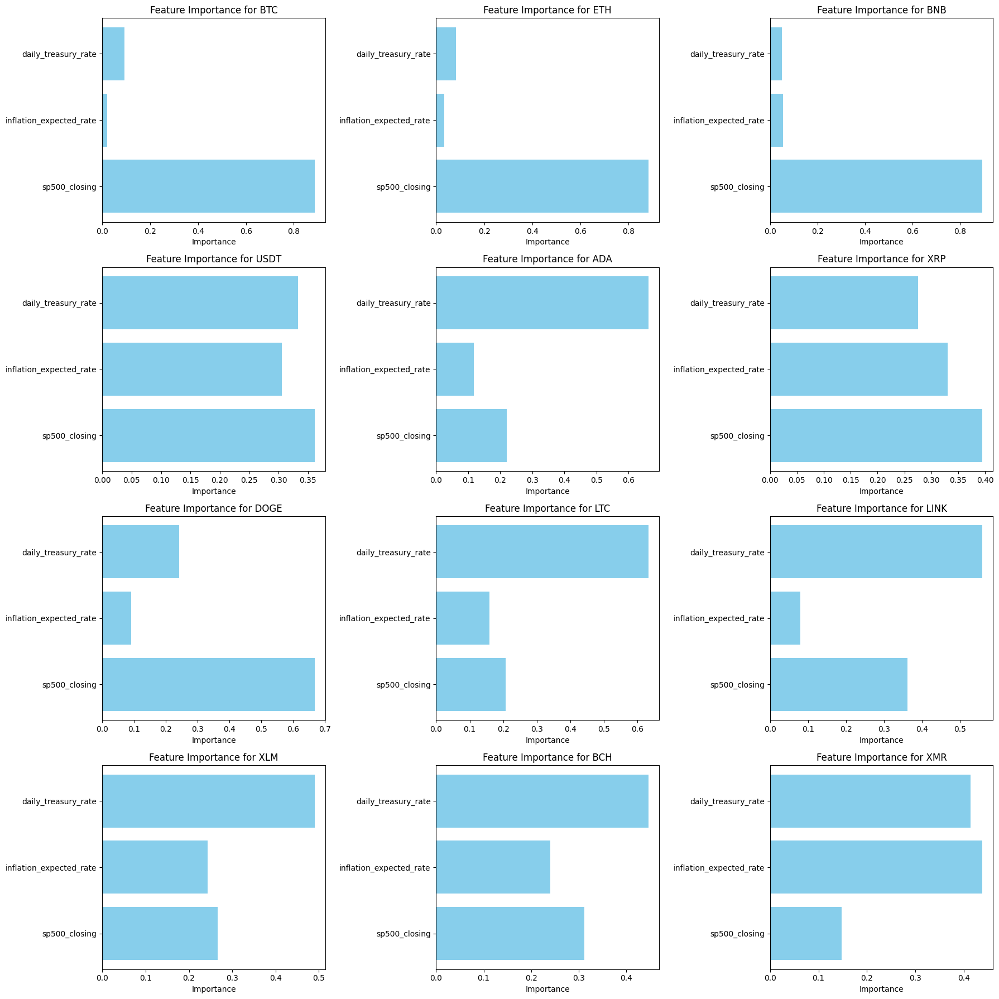

Feature Importance for all coins:
                            BTC       ETH       BNB      USDT       ADA       XRP      DOGE       LTC      LINK       XLM       BCH       XMR  
sp500_closing            0.887098  0.883751  0.895131  0.361401  0.220646  0.395103  0.667596  0.207516  0.361560  0.266047  0.311965  0.147724
inflation_expected_rate  0.019808  0.034398  0.054261  0.305465  0.116971  0.330019  0.091341  0.159155  0.079211  0.243731  0.240696  0.438202
daily_treasury_rate      0.093094  0.081852  0.050608  0.333134  0.662383  0.274878  0.241063  0.633329  0.559229  0.490222  0.447339  0.414074


In [38]:
# Assuming df is your dataset and 'bitcoin_closing_prices' is the target variable
X = df[['sp500_closing', 'inflation_expected_rate', 'daily_treasury_rate']]
y = df[['BTC', 'ETH', 'BNB', 'USDT', 'ADA', 'XRP', 'DOGE', 'LTC', 'LINK', 'XLM', 'BCH', 'XMR']]  # Multiple targets

# Train a Random Forest model using MultiOutputRegressor
rf_model = RandomForestRegressor(n_estimators=1230, random_state=42)
multi_output_rf = MultiOutputRegressor(rf_model)
multi_output_rf.fit(X, y)

# Prepare a DataFrame to hold feature importances for each coin
feature_importance_df = pd.DataFrame(index=X.columns)

# Create a 4x3 grid for individual plots (12 coins)
fig, axes = plt.subplots(4, 3, figsize=(18, 18))
axes = axes.flatten()

# Get feature importances for each target (coin)
for target_idx, target_column in enumerate(y.columns):
    importances = multi_output_rf.estimators_[target_idx].feature_importances_

    # Add the importances to the DataFrame
    feature_importance_df[target_column] = importances

    # Plot the feature importances
    ax = axes[target_idx]
    ax.barh(X.columns, importances, color='skyblue')
    ax.set_xlabel('Importance')
    ax.set_title(f'Feature Importance for {target_column}')

# Adjust layout for a 4x3 grid of subplots
plt.tight_layout()

# Show the plots
plt.show()

# Print the feature importance DataFrame
print("Feature Importance for all coins:")
print(feature_importance_df)